# <div style="text-align: center"> <font size=+5> <ins>ANALYSE DATA</ins> </font> </div>
___

# Loading variables

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd

import os

import warnings

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt

plt.rcParams.update({'figure.dpi' : 300,
                     'mathtext.fontset' : 'stix', 
                     'font.family' : 'STIXGeneral'
                    })

pd.set_option('display.max_columns', 500)

In [2]:
data_issp = pd.read_pickle("Processed_Data/questionnaires/issp_questionnaires_common.pickle").loc[:,("Questions", slice(None))].droplevel("Variable Type", axis=1)
data_issp["Weight"] = pd.read_pickle("Processed_Data/questionnaires/issp_questionnaires_common.pickle").loc[:,("Respondent Data", "Weight")]
data_issp.columns.name = None

data_GDPgrowth = pd.read_pickle("Processed_Data/indicators/GDP_growth.pickle")
data_GDPpcap = pd.read_pickle("Processed_Data/indicators/GDP_pcap.pickle")
worldmap = pd.read_pickle("Processed_Data/misc/worldmap.pickle")

In [3]:
def conv_answers(label):
    convDict = {
        "Strongly Disagree" : -2,
        "Disagree" : -1,
        "Neither Agree nor Disagree" : 0,
        "Agree" : 1,
        "Strongly Agree" : 2,

        "Yes" : 1,
        "No" : -1,

        'Extremely dangerous': 2,
        'Very dangerous': 1,
        'Somewhat dangerous': 0,
        'Not very dangerous': -1,
        'Not dangerous at all': -2,

        "Always" : 3,
        "Often" : 2,
        "Sometimes" : 1,
        "Never" : 0,

        'Very willing': 2,
        'Fairly willing': 1,
        'Neither willing nor unwilling': 0,
        'Fairly unwilling': -1,
        'Very unwilling': -2
    }
    return convDict[label] if label in convDict else label

___
# Trends by region

In [ ]:
def get_region(country):
    if country in ["Germany", "United Kingdom", "Hungary", "Italy", "Ireland", "Netherlands", "Norway", "Czechia", "Slovenia", "Poland", "Bulgaria", "Spain", "Austria", "Sweden", "Latvia", "Portugal", "Denmark", "Switzerland", "Finland", "Belgium", "France", "Croatia", "Iceland", "Lithuania", "Slovakia"]:
        return "Europe"
    elif country in ["Russia", "Philippines", "Israel", "Japan", "South Corea", "Turkiye", "South Africa", "Taiwan", "China", "India", "Thailand", "Chile", "Mexico", "Argentina"]:
        return "Asia / Africa / Central and South America"
    elif country in ["United States", "Canada", "Australia", "New Zealand"]:
        return "North America / Australia / New Zealand"
    else:
        return "Other"

/var/folders/mv/3xxn6x011nj1xbbrht5z6r1m0000gn/T/ipykernel_2021/2662093324.py:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1,2, figsize=(6.4*2,4.8), gridspec_kw={'width_ratios': [1.6, 1]})


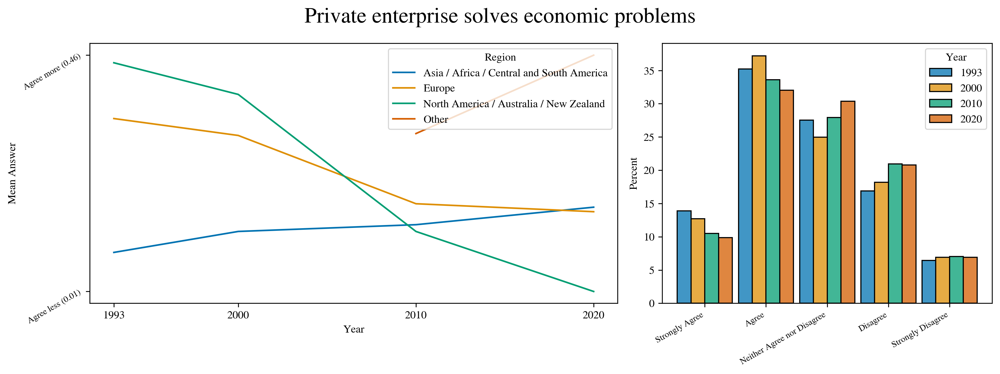

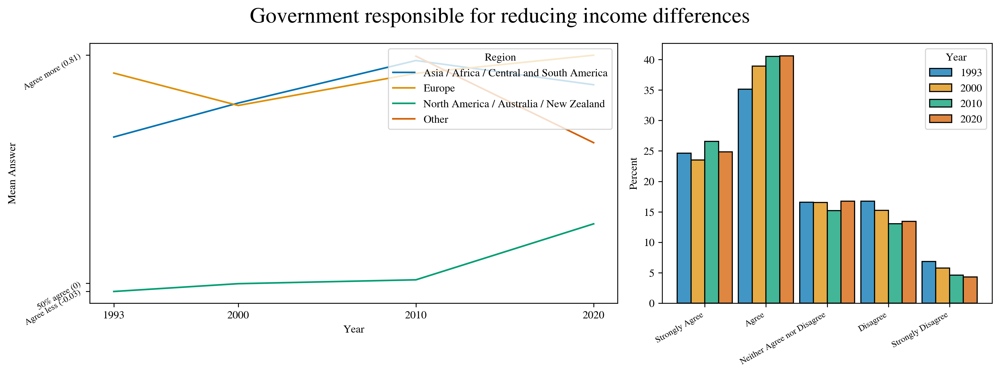

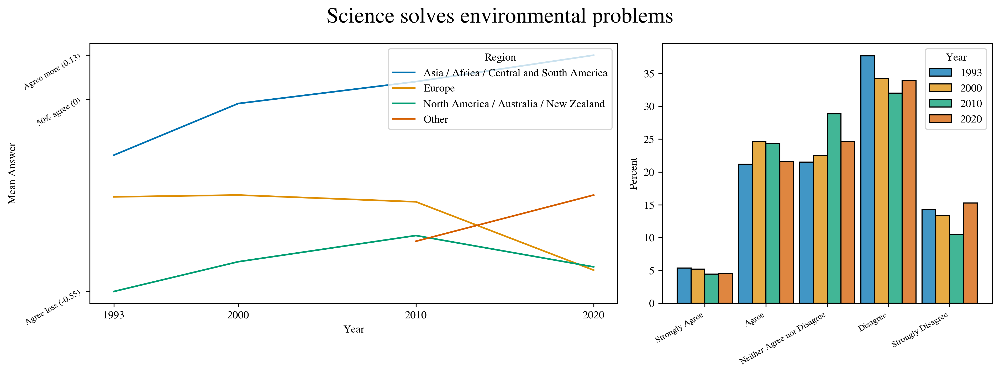

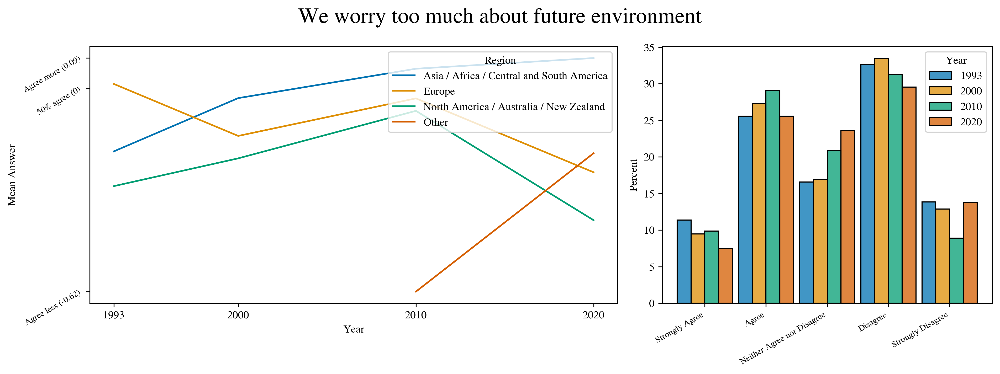

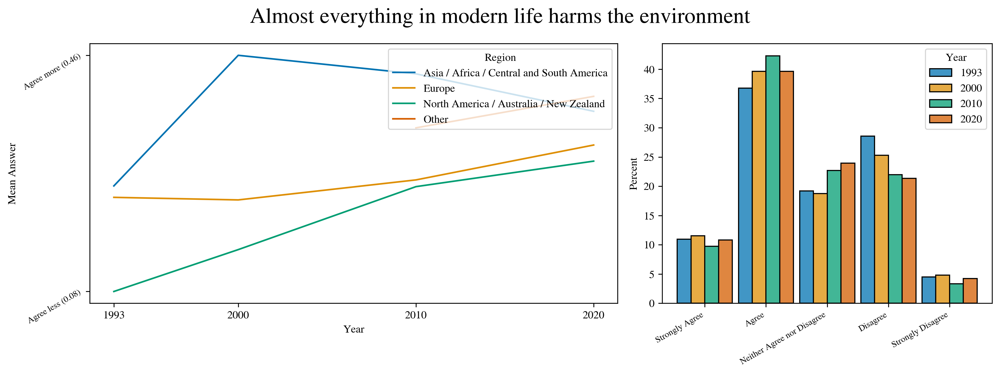

...

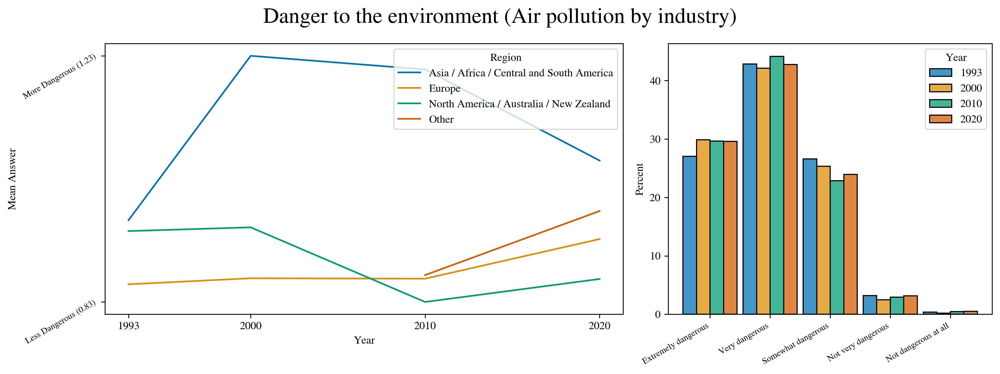

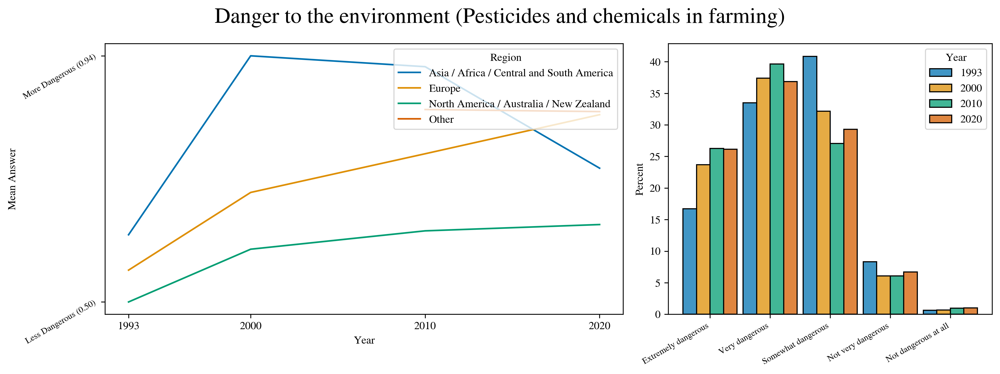

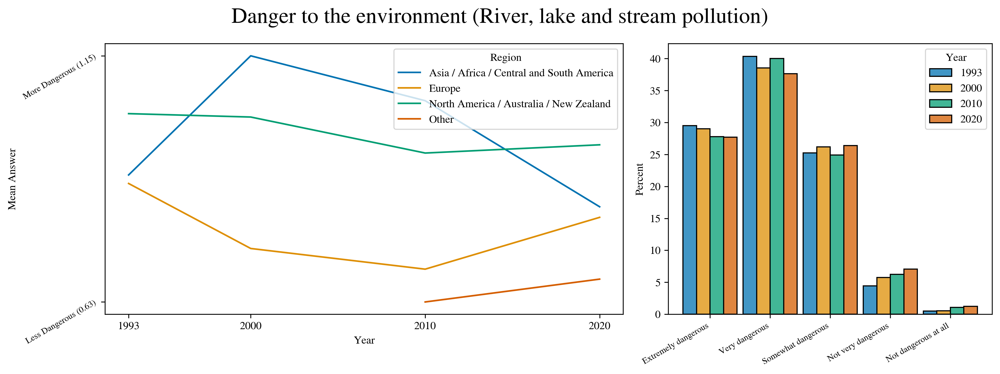

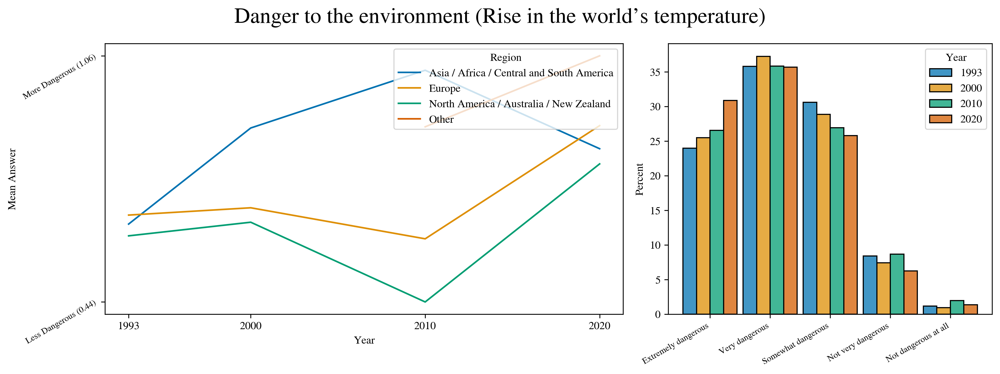

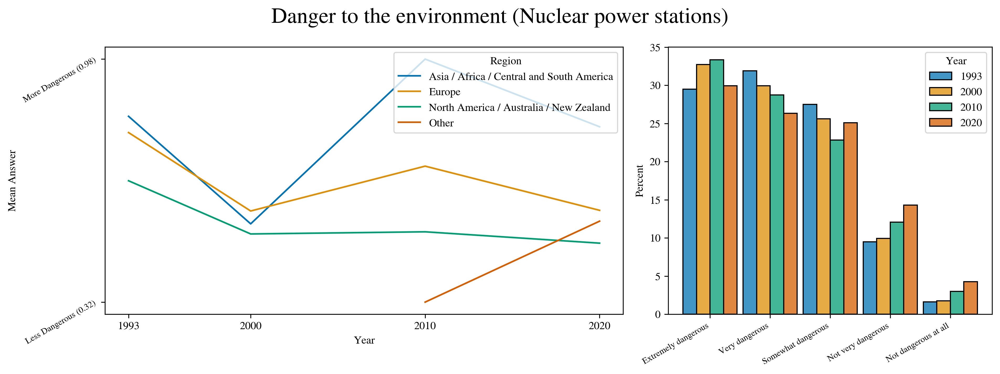

In [44]:
#plotting data
cols = [
    #economy vs environment (link to economic growth)
    'Environmental protection needs economic growth', 'Economic growth harms environment', 
    #environmental activism (link to policy implementation in different states)
    'We worry too much about harming environment', 'In the last five years, participated in an environmental demonstration',
    #perception of danger to environment (link to actual environmental data -> pollution levels / deaths because of pollution...)
    'Danger to the environment (Air pollution by cars)', 'Danger to the environment (Air pollution by industry)', 'Danger to the environment (River, lake and stream pollution)',
    #climate change (link to countries most affected by climate change -> extreme climate events...?
    'Danger to the environment (Rise in the world’s temperature)'
]
        

cols = list(data_issp.columns.drop(["Weight", "Highest priority for country", "Second highest priority for country"])) #uncomment to plot all columns


data = data_issp[cols].copy()
data = data.map(conv_answers).astype(float)
data = data.mul(data_issp["Weight"], axis="index").groupby(["Year", "Country"]).sum().div(data_issp["Weight"].groupby(["Year", "Country"]).sum(), axis="index")
data["Region"] = data.index.get_level_values("Country").map(get_region)

def set_y_axis(ax, data, type):
    ticks = [data.min(), data.max()]
    if ticks[0] < 0 and ticks[1]>0:
        ticks = [ticks[0], 0, ticks[1]]
        label = {
            "agree" : [f"Agree less ({ticks[0]:.2f})", "50% agree (0)", f"Agree more ({ticks[2]:.2f})"],
            "yesno" : [f"More No ({ticks[0]:.2f})", "50% Yes - 50% No (0)", f"More Yes ({ticks[2]:.2f})"],
            "danger" : [f"Dangerous ({ticks[0]:.2f})", "Somewhat dangerous (0)", f"Not Dangerous ({ticks[2]:.2f})"],
            "will" : [f"Unwilling ({ticks[0]:.2f})", "50% willing (0)", f"Willing ({ticks[2]:.2f})"],
        }[type]
    else:
        label = {
            "agree" : [f"Agree less ({ticks[0]:.2f})", f"Agree more ({ticks[1]:.2f})"],
            "yesno" : [f"More No ({ticks[0]:.2f})", f"More Yes ({ticks[1]:.2f})"],
            "danger" : [f"Less Dangerous ({ticks[0]:.2f})", f"More Dangerous ({ticks[1]:.2f})"],
            "freq" : [f"Less Often ({ticks[0]:.2f})", f"More Often ({ticks[1]:.2f})"],
            "will" : [f"Less Willing ({ticks[0]:.2f})", f"More Willing ({ticks[1]:.2f})"],
        }[type]
    ax.set_yticks(ticks)
    ax.set_yticklabels(label)

for i,col in enumerate(cols):
    fig, axs = plt.subplots(1,2, figsize=(6.4*2,4.8), gridspec_kw={'width_ratios': [1.6, 1]})
    fig.suptitle(col, fontsize=20)
    
    dataplot = data.groupby(["Year", "Region"]).mean().reset_index()
    sns.lineplot(data=dataplot, x="Year", y=col, hue="Region", palette="colorblind", ax=axs[0])
    
    axs[0].set_xticks([1993,2000,2010,2020])
    
    axs[0].set_ylabel("Mean Answer")
    
    if "Agree" in data_issp[col].values:
        set_y_axis(axs[0], dataplot[col], "agree")
    if "Yes" in data_issp[col].values:
        set_y_axis(axs[0], dataplot[col], "yesno")
    if "Extremely dangerous" in data_issp[col].values:
        set_y_axis(axs[0], dataplot[col], "danger")
    if "Always" in data_issp[col].values:
        set_y_axis(axs[0], dataplot[col], "freq")
    if "Very willing" in data_issp[col].values:
        set_y_axis(axs[0], dataplot[col], "will")
    
    sns.move_legend(axs[0], "upper right")
    
    sns.histplot(data=data_issp.reset_index(), x=col, hue="Year", stat="percent", shrink=0.9, multiple="dodge", palette="colorblind", common_norm=False, ax=axs[1])
    axs[1].set_xlabel("")
    for tick in axs[1].get_xticklabels() + axs[0].get_yticklabels():
        tick.set_fontsize(8)
        tick.set_horizontalalignment('right')
        tick.set_rotation(30)
    
    plt.tight_layout()


del(data, dataplot, set_y_axis)

___
# Economy and the environment

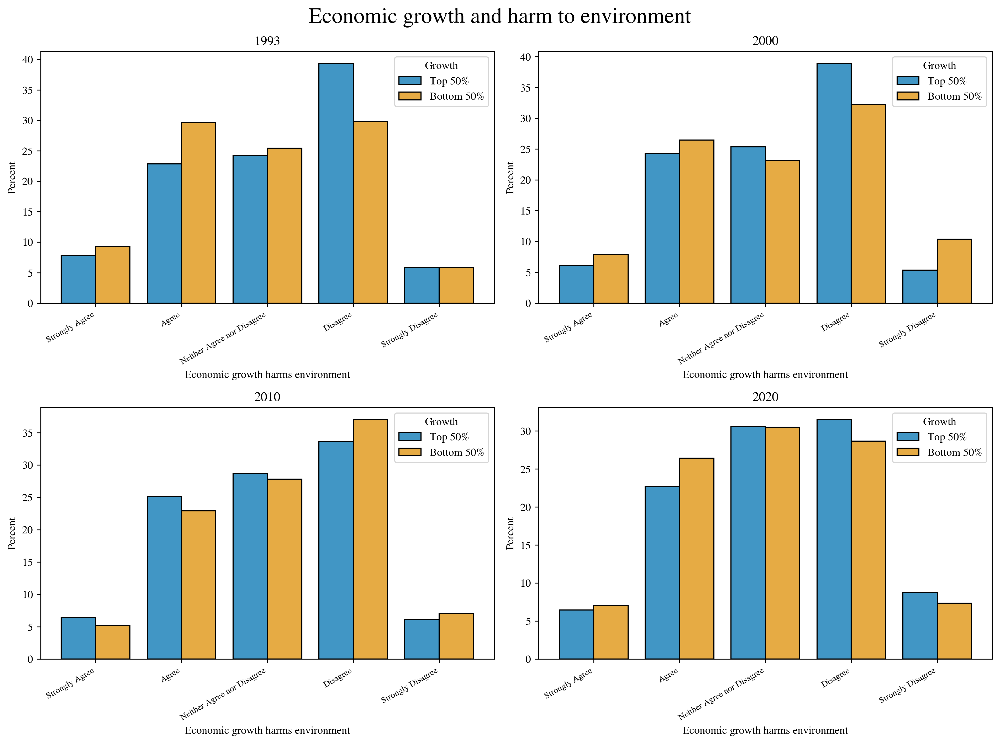

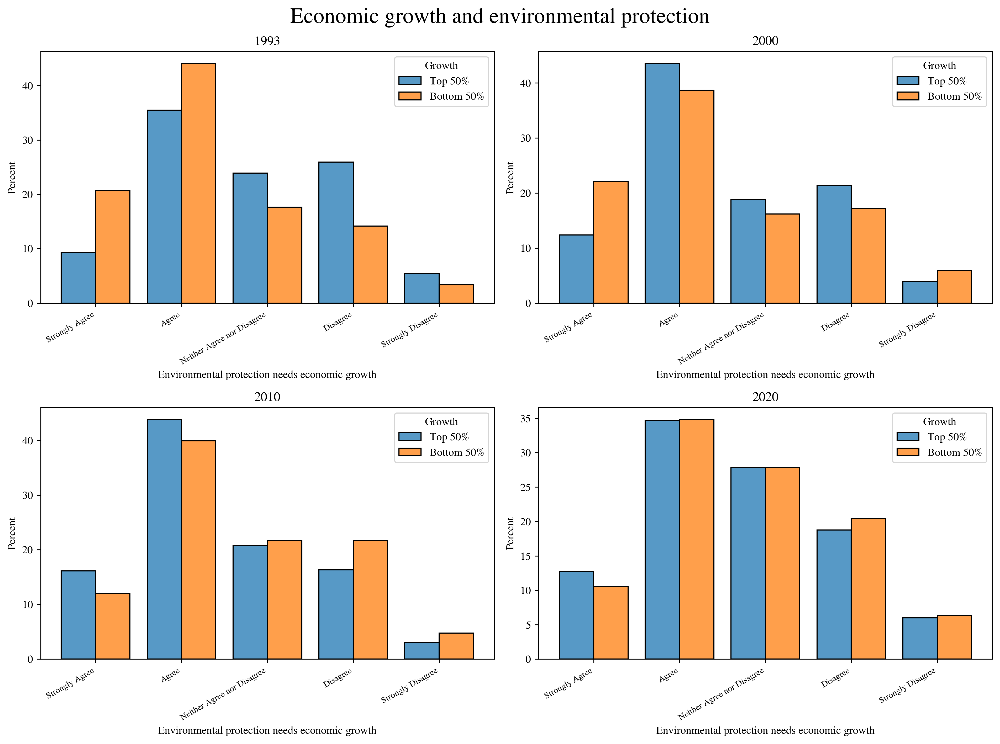

In [6]:
fig, axs = plt.subplots(2, 2, figsize=(6.4*2,4.8*2))
fig.suptitle("Economic growth and harm to environment", fontsize=20)

for i, year in enumerate([1993,2000,2010,2020]):
    growing_countries = [c for c in data_GDPgrowth.index.drop("World") if data_GDPgrowth.loc[c, year] >= data_GDPgrowth.drop(index="World")[year].median()]

    ax = axs[i//2,i%2]
    data = data_issp.loc[(year, slice(None)),:].reset_index().copy()
    data["Growth"] = data["Country"].map(lambda x: "Top 50%" if x in growing_countries else "Bottom 50%")
    data = data.sort_values("Growth", axis=0, ascending=False)
    sns.histplot(data=data.query("Country != 'Taiwan'"), x="Economic growth harms environment", hue="Growth", weights="Weight", common_norm=False, multiple="dodge", stat="percent", shrink=0.8, palette="colorblind", ax=ax)
    ax.set_title(year)
    for tick in ax.get_xticklabels():
        tick.set_fontsize(8)
        tick.set_horizontalalignment('right')
        tick.set_rotation(30)
plt.tight_layout()


fig, axs = plt.subplots(2, 2, figsize=(6.4*2,4.8*2))
fig.suptitle("Economic growth and environmental protection", fontsize=20)

for i, year in enumerate([1993,2000,2010,2020]):
    growing_countries = [c for c in data_GDPgrowth.index.drop("World") if data_GDPgrowth.loc[c, year] >= data_GDPgrowth.drop(index="World")[year].median()]

    ax = axs[i//2,i%2]
    data = data_issp.loc[(year, slice(None)),:].reset_index().copy()
    data["Growth"] = data["Country"].map(lambda x: "Top 50%" if x in growing_countries else "Bottom 50%")
    data = data.sort_values("Growth", axis=0, ascending=False)
    sns.histplot(data=data.query("Country != 'Taiwan'"), x="Environmental protection needs economic growth", hue="Growth", weights="Weight", common_norm=False, multiple="dodge", stat="percent", shrink=0.8, ax=ax)
    ax.set_title(year)
    for tick in ax.get_xticklabels():
        tick.set_fontsize(8)
        tick.set_horizontalalignment('right')
        tick.set_rotation(30)
plt.tight_layout()

del(data)

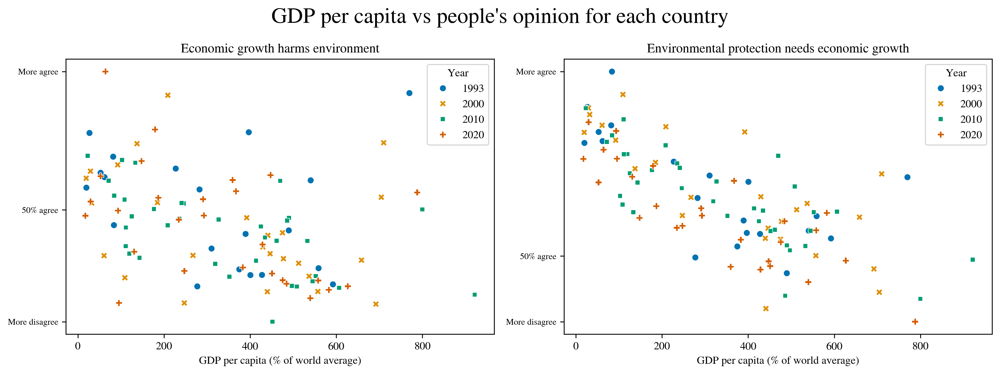

In [185]:
data = data_issp.query("Country != 'Taiwan'").loc[:,["Economic growth harms environment", "Environmental protection needs economic growth", "Weight"]].copy()
data = data.map(conv_answers).astype(float)
data = data[["Economic growth harms environment", "Environmental protection needs economic growth"]].mul(data["Weight"], axis="index").groupby(["Year", "Country"]).sum().div(data["Weight"].groupby(["Year", "Country"]).sum(), axis="index")
data["GDP per capita (% of world average)"] = data.index.map(lambda x: 100*data_GDPpcap.loc[x[1], x[0]].copy() / data_GDPpcap.loc["World",x[0]].copy())


fig, axs = plt.subplots(1,2,figsize=(6.4*2,4.8), sharey=False)
fig.suptitle("GDP per capita vs people's opinion for each country", fontsize=20)

for i, val in enumerate(["Economic growth harms environment", "Environmental protection needs economic growth"]):
    ax = axs[i]
    sns.scatterplot(data=data.reset_index(), x="GDP per capita (% of world average)", y=val, hue="Year", palette="colorblind", style="Year", ax=ax)
    ax.set_title(val)
    ax.set_ylabel("")
    ax.set_yticks([data[val].min(), 0, data[val].max()])
    ax.set_yticklabels(["More disagree", "50% agree", "More agree"], fontsize=8)

plt.tight_layout()

del(data)

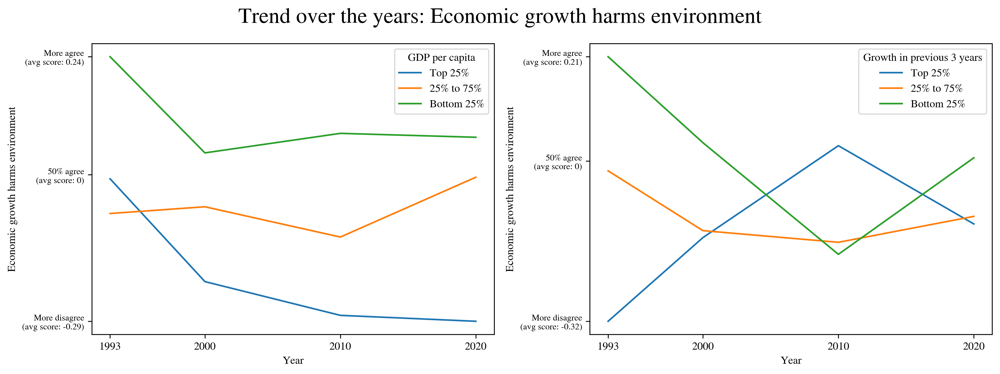

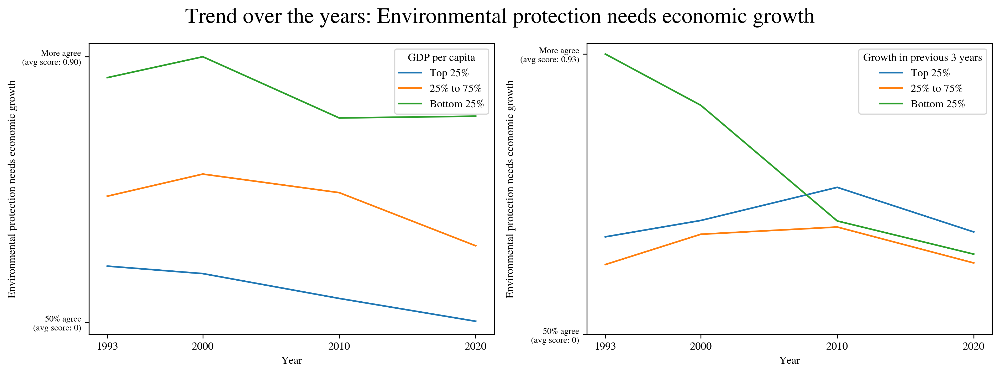

In [8]:
data = data_issp.query("Country != 'Taiwan'").loc[:,["Economic growth harms environment", "Environmental protection needs economic growth", "Weight"]].copy()
data = data.map(conv_answers).astype(float)
data = data[["Economic growth harms environment","Environmental protection needs economic growth"]].mul(data["Weight"], axis="index").groupby(["Year", "Country"]).sum().div(data["Weight"].groupby(["Year", "Country"]).sum(), axis="index")
data["Growth in previous 3 years"] = pd.Categorical(data.index.map(lambda x: (np.nan if np.isnan(data_GDPgrowth.loc[x[1],x[0]]) else ("Bottom 25%" if data_GDPgrowth.loc[x[1],x[0]] < data_GDPgrowth.loc[:,x[0]].quantile(0.25) else "25% to 75%") if data_GDPgrowth.loc[x[1],x[0]] < data_GDPgrowth.loc[:,x[0]].quantile(0.75) else "Top 25%")), ["Top 25%", "25% to 75%", "Bottom 25%"])
data["GDP per capita"] = pd.Categorical(data.index.map(lambda x: ("Bottom 25%" if data_GDPpcap.loc[x[1],x[0]] < data_GDPpcap.loc[:,x[0]].quantile(0.25) else "25% to 75%") if data_GDPpcap.loc[x[1],x[0]] < data_GDPpcap.loc[:,x[0]].quantile(0.75) else "Top 25%"), ["Top 25%", "25% to 75%", "Bottom 25%"])

with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    for q in ["Economic growth harms environment", "Environmental protection needs economic growth"]:
        fig, axs = plt.subplots(1,2,figsize=(6.4*2,4.8))
        fig.suptitle(f"Trend over the years: {q}", fontsize=20)
        for i, y in enumerate(["GDP per capita", "Growth in previous 3 years"]):
            dataplot = data[[q, y]].groupby(["Year", y]).mean().reset_index()
            sns.lineplot(data=dataplot, x="Year", y=q, hue=y, ax = axs[i])
            axs[i].set_xticks([1993,2000,2010,2020])
            if q == "Economic growth harms environment":
                axs[i].set_yticks([dataplot[q].min(), 0, dataplot[q].max()])
                axs[i].set_yticklabels([f"More disagree\n(score=avg score: {dataplot[q].min():.2f})", "50% agree\n(score=avg score: 0)", f"More agree\n(score=avg score: {dataplot[q].max():.2f})"], fontsize=8)
            elif q == "Environmental protection needs economic growth":
                axs[i].set_yticks([0, dataplot[q].max()])
                axs[i].set_yticklabels(["50% agree\n(score=avg score: 0)", f"More agree\n(score=avg score: {dataplot[q].max():.2f})"], fontsize=8)
        plt.tight_layout()

del(data, dataplot)

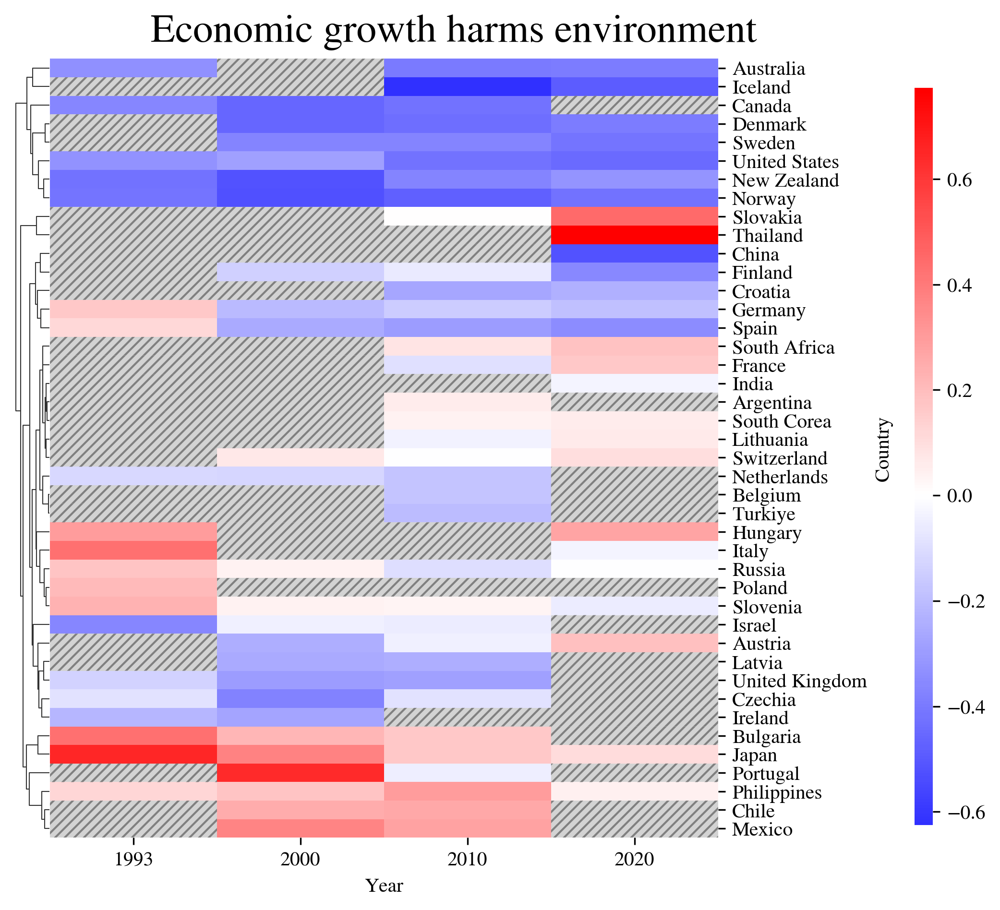

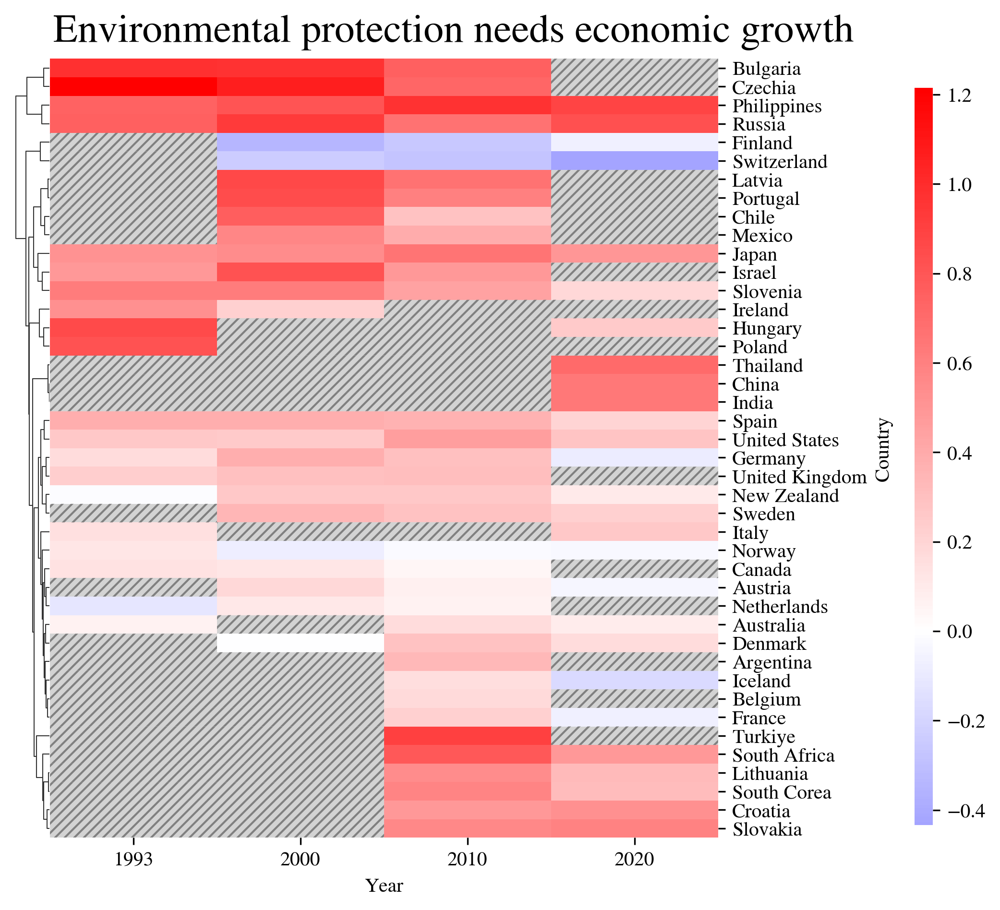

In [151]:
from matplotlib.colors import ListedColormap
for q in ["Economic growth harms environment", "Environmental protection needs economic growth"]:
    data = data_issp.query("Country != 'Taiwan'").loc[:,[q, "Weight"]].copy()
    data = data.map(conv_answers).astype(float)
    data = data[[q]].mul(data["Weight"], axis="index").groupby(["Year", "Country"]).sum().div(data["Weight"].groupby(["Year", "Country"]).sum(), axis="index")
    data = data[q].reset_index().pivot(index="Country", columns="Year", values=q)

    cmap = mpl.colormaps.get_cmap('bwr')
    cmap.set_bad("lightgray")
    clm = sns.clustermap(data.map(lambda x: x if not np.isnan(x) else 0), mask=np.isnan(data), col_cluster=False, dendrogram_ratio=0.05, figsize=(6.4,6.4), cbar_pos=(1,0.1,.02,.8), cmap=cmap, center=0, yticklabels=1)

    
    zm = np.ma.masked_invalid(data.map(lambda x: 1 if np.isnan(x) else np.nan).reindex([t.get_text() for t in clm.fig.axes[2].get_yticklabels()]))
    x = np.arange(len(data.columns)+1)
    y = np.arange(len(data.index)+1)
    none_map = ListedColormap(['none'])
    clm.fig.axes[2].pcolor(x, y, zm, cmap=none_map, edgecolor="gray", lw=0, hatch='/////')
    
    plt.gcf().suptitle(q, fontsize=20)
    
    del(data)

___
# Trends by Respondent Data (TODO)

In [17]:
# get full dataset
data_issp = pd.read_pickle("Processed_Data/questionnaires/issp_questionnaires_common.pickle")

# convert values to numerical data
conv_dict = {
    "Respondent Data" : {
        "Sex" : {"Male" : -1, "Female" : 1},
        "Education level" : {"No degree" : 0, "Primary" : 1, "Secondary" : 2, "University" : 3},
        "Living area" : {"Rural area" : 0, "Small city" : 1, "Big city" : 2},
        "Political orientation" : {"Far Left" : -3, "Left" : -2, "Center Left" : -1, "Center" : 0, "None/Other" : 0, "Center Right" : 1, "Right" : 2, "Far Right" : 3},
        "Religious beliefs" : {"Atheist" : 0, "Christian" : 1, "Islamic" : 1, "Jewish" : 1, "Other" : 1}
    },
    "Questions" : {
        "Strongly Disagree" : -2,
        "Disagree" : -1,
        "Neither Agree nor Disagree" : 0,
        "Agree" : 1,
        "Strongly Agree" : 2,

        "Yes" : 1,
        "No" : -1,

        'Extremely dangerous': 2,
        'Very dangerous': 1,
        'Somewhat dangerous': 0,
        'Not very dangerous': -1,
        'Not dangerous at all': -2,

        "Always" : 3,
        "Often" : 2,
        "Sometimes" : 1,
        "Never" : 0,

        'Very willing': 2,
        'Fairly willing': 1,
        'Neither willing nor unwilling': 0,
        'Fairly unwilling': -1,
        'Very unwilling': -2
    }
}

#convert values to numerical
data_resp = data_issp.loc[:,("Respondent Data", slice(None))].apply(lambda col: col if col.name[1] not in conv_dict["Respondent Data"] else col.map(lambda x: np.nan if pd.isna(x) else conv_dict["Respondent Data"][col.name[1]][x]).astype(float))
data_quest = data_issp.loc[:,("Questions", slice(None))].map(lambda x: conv_dict["Questions"].get(x, x)).astype(float)

#cluster questions based on topic
clusters = {
    #TOPIC 1: awareness of the environmental consequences of societies’ modern, industrial activities
    "Awareness" : [
        'Danger to the environment (Air pollution by cars)',
        'Danger to the environment (Air pollution by industry)',
        'Danger to the environment (Pesticides and chemicals in farming)',
        'Danger to the environment (River, lake and stream pollution)',
        'Danger to the environment (Rise in the world’s temperature)',
        'Danger to the environment (Nuclear power stations)'
    ],

    #TOPIC 2: willingness to sacrifice personally in some manner (e.g. time, money) for the environment
    "Will to make sacrifices" : [
        'Willingness to Make Trade-Offs for Environment (Pay much higher prices)',
        'Willingness to Make Trade-Offs for Environment (Pay much higher taxes)',
        'Willingness to Make Trade-Offs for Environment (Cut your standard of living)',
        'Member of a group to preserve environment',
        'In the last five years, signed a petition',
        'In the last five years, given money',
        'In the last five years, participated in an environmental demonstration',
        'I do what is right even when it costs money and takes time'
    ],
    
    #TOPIC 3: importance of addressing environmental problems and of collective effort for resolving environmental
    #issues and how environmental issues inter- sect with economic issues, science and progress
    # NB!! answers are rescaled so that higher scores reflect pro-environment responses
    "Efficacy of environmental action" : [
        'We worry too much about harming environment',
        'We worry too much about future environment',
        'Science solves environmental problems',
        'Too difficult to do much about environment'
    ]
        
}

#rescale
data_to_cluster = data_quest.apply(lambda x: x if x.name[1] not in clusters["Efficacy of environmental action"] else -x)
data_quest_clustered = pd.concat([pd.concat([data_to_cluster.loc[:, ("Questions", clusters[topic])].sum(axis=1) for topic in clusters], axis=1, keys=clusters.keys())], keys=["Environmental concern dimension"],  names=["Variable Type", "Variable Name"], axis=1)


#get country-wide indicators columns
macro_indicators_dict = {(ind[:-7]) : pd.read_pickle(f"Processed_Data/indicators/{ind}") for ind in os.listdir("Processed_Data/indicators") if ind[-7:] == ".pickle"}
data_indic = pd.concat([pd.DataFrame.from_records([data_issp.index.map(lambda idx: indicator.loc[idx[1], idx[0]]) for indicator in macro_indicators_dict.values()], index=macro_indicators_dict.keys(), columns=data_issp.index).T], keys=["Country-wide indicators"], names=["Variable Type", "Variable Name"], axis=1)


#merge into single dataframes
data_issp_full = pd.concat([data_issp, data_indic], axis=1) #questionnaires + indicators full dataset
data_issp_numerical = pd.concat([data_resp, data_indic, data_quest], axis=1) #separate questions, numerical dataset
data_issp_numerical_clustered = pd.concat([data_resp, data_indic, data_quest_clustered], axis=1) #clustered questions into topics


del(data_issp, data_resp, data_quest, data_to_cluster, data_quest_clustered, data_indic, conv_dict)

<Axes: xlabel='Religious beliefs', ylabel='Awareness'>

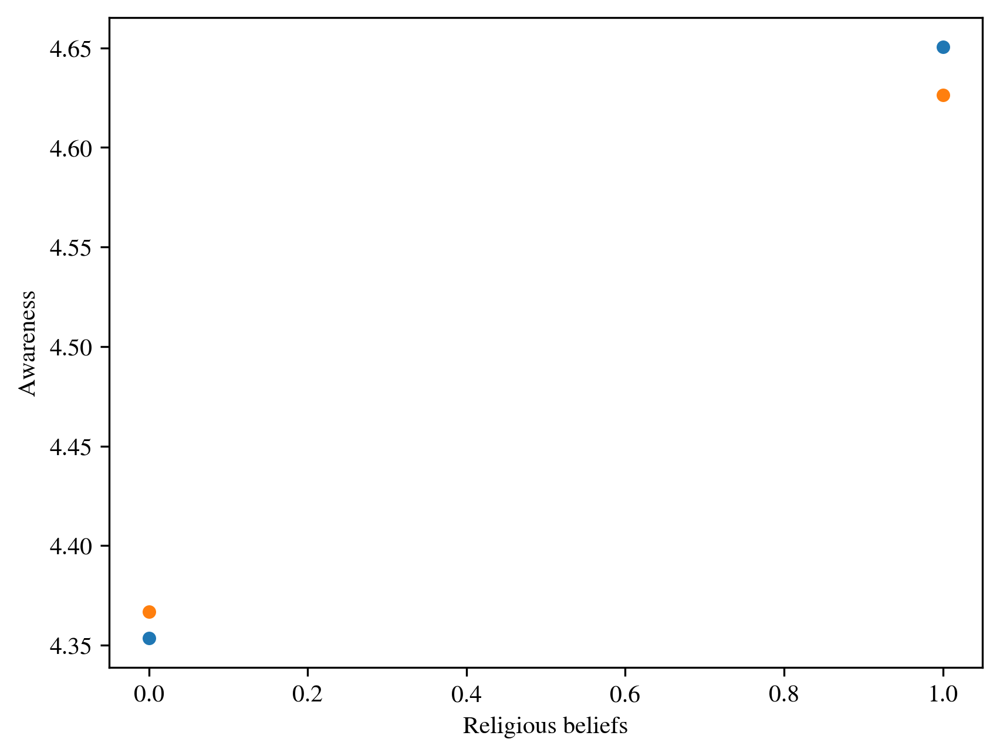

In [80]:
def groupby_indicator_mean(data, indicator):
    data_x_weights = data.drop(columns=[("Respondent Data", "Weight"),indicator]).mul(data.loc[:,("Respondent Data", "Weight")], axis=0)
    data_x_weights[indicator] = data.loc[:, indicator]
    data_x_weights = data_x_weights.groupby(indicator).sum()
    weights = data.groupby(indicator).sum().loc[:,("Respondent Data", "Weight")]
    res = data_x_weights.div(weights, axis=0)
    res.index.name = indicator[1]
    return res

fig, ax = plt.subplots()
ind = "Religious beliefs"
topic = "Awareness"
sns.scatterplot(groupby_indicator_mean(data_issp_numerical_clustered, ("Respondent Data", ind)).droplevel(level=0, axis=1), x=ind, y=topic, ax=ax)
sns.scatterplot(data_issp_numerical_clustered.droplevel(level=0, axis=1).groupby(ind).mean(), x=ind, y=topic, ax=ax)

___
# Clusters of questions

- Some questions may be grouped into single "topic" -> which ones?

#### Topics:
1. Awareness (Danger to environment (...))
2. Will to act (Willingness to make trade-offs (...), Sort glass, Member of group, Signed petition, Participated in demonstration, Given Money, I do what is right)
3. Efficacy of environmental action (We worry too much..., Too difficult to do much..., Science solves environmental problems)

[]

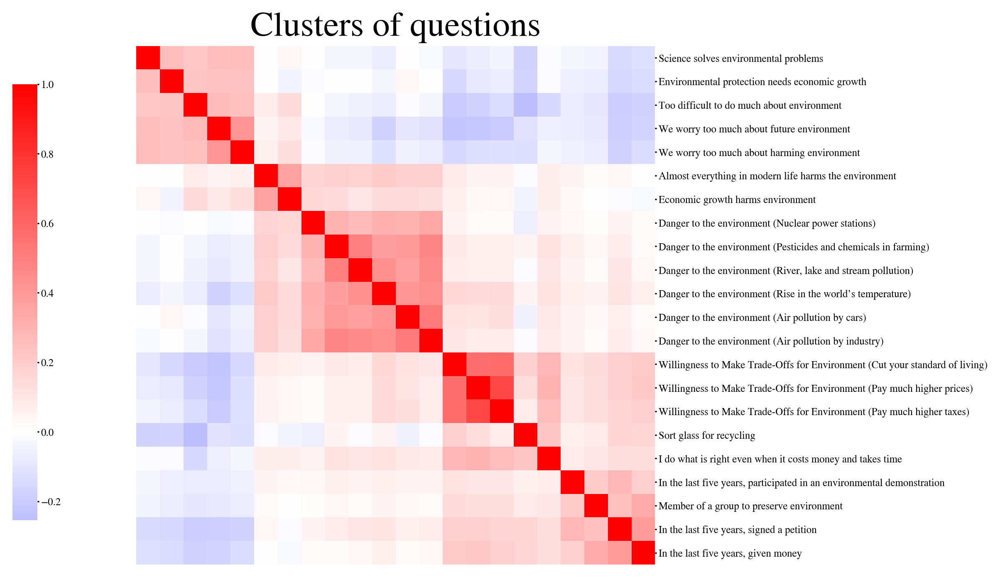

In [13]:
clm = sns.clustermap(data_issp.drop(columns=["Weight"]).map(conv_answers).astype(float).corr(), cmap="bwr", center=0, cbar_pos=(0.02, 0.5, 0.02, 0.35), method="ward")
clm.ax_row_dendrogram.set_visible(False)
clm.ax_col_dendrogram.set_visible(False)
clm.tick_params(size=1, pad=1, labelsize=6)

clm.ax_heatmap.set_title("Clusters of questions", fontsize=20);
clm.ax_heatmap.set_xticks([])

#clm.savefig("Figures/questions_clusters.pdf", format="pdf")

___
# Countries comparison

In [10]:
from matplotlib.colors import TwoSlopeNorm as norm

In [11]:
Q = 'Economic growth harms environment'

In [12]:
data = data_issp.drop(columns=["Weight", "Highest priority for country", "Second highest priority for country"]).copy()
data = data.map(conv_answers).astype(float)
data = data.mul(data_issp["Weight"], axis="index").groupby(["Year", "Country"]).sum().div(data_issp["Weight"].groupby(["Year", "Country"]).sum(), axis="index").groupby("Country").mean()
data["geometry"] = data.index.get_level_values("Country").map(lambda c: worldmap.loc[c,"geometry"])
data = gpd.GeoDataFrame(data)

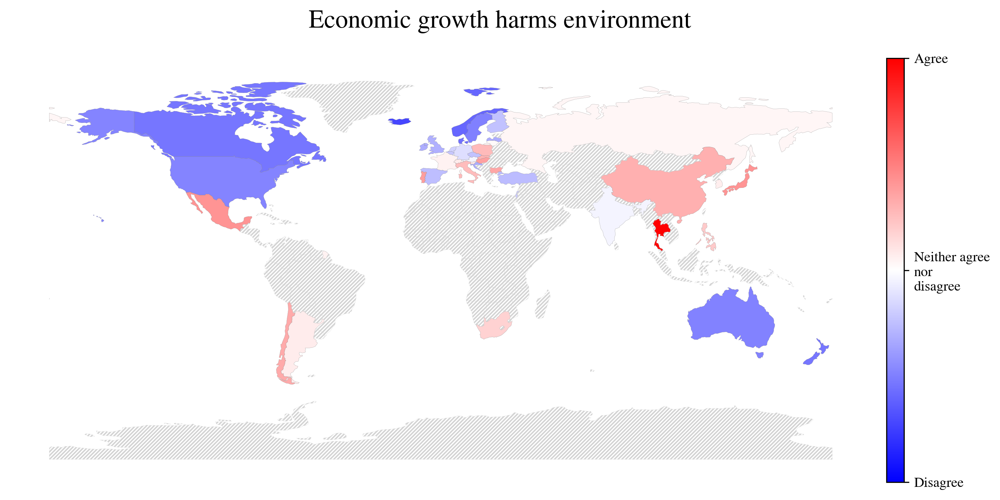

In [14]:
fig, (ax, cax) = plt.subplots(1,2, gridspec_kw={"width_ratios" : [0.98,0.02]}, figsize=(10,5))

data.plot(column=Q, ax=ax, edgecolor="gray", lw=0.1, legend=True, legend_kwds={"orientation" : "vertical"}, cax=cax, cmap="bwr", norm=norm(vmin=-data[Q].abs().max(), vcenter=0, vmax=data[Q].max()))
worldmap.query("in_issp_1993 == False and in_issp_2000 == False and in_issp_2010 == False and in_issp_2020 == False").plot(color="none", hatch="/////////", edgecolor="lightgray", lw=0.1, ax=ax)

fig.suptitle(Q, fontsize=18)
cax.set_yticks([-data[Q].abs().max(), 0, data[Q].max()])
cax.set_yticklabels(["Disagree", "Neither agree\nnor\ndisagree", "Agree"])
ax.set_axis_off()
plt.tight_layout()